### Plot the embeddings of multiple integrations of Chen + X at the same time

In [1]:

import scIB
import numpy as np
import scanpy as sc
# ls -ltrh /storage/groups/ml01/workspace/ignacio.ibarra/theislab/retinal_scRNAseq_integration/data/integration_march_2021/input/input*_cells.h5ad
import os
from os.path import exists, join
from os import makedirs, listdir
import pandas as pd
# ad = sc.read_h5ad('/home/icb/ignacio.ibarra/theislab/scIB_output/retinal_all_batch_donor_dataset_cell.type/prepare/unscaled/HVG.2K/adata_pre.h5ad')
# ad.shape
### here we write a version of the script in where we are sampling Chen_a/b/c

/home/icb/ignacio.ibarra/miniconda3/envs/scIB-python/lib/python3.7/site-packages/rpy2/robjects/pandas2ri.py:14: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import Index as PandasIndex


In [ ]:
# this might require manual installation
import scvelo as scv

In [2]:
import anndata
from os.path import abspath
from os.path import basename

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import rcParams
rcParams['figure.dpi'] = 150

In [9]:
basedir = '/mnt/znas/icb_zstore01/groups/ml01/workspace/ignacio.ibarra/theislab/retinal_scRNAseq_integration/data/integration_march_2021/output'
for d in listdir(basedir):
    if 'retinal_all_' in d:
        if not os.path.isdir(join(basedir, d)):
            continue
        print(d)
        p = join(basedir, d)
        
        for method in ['scvi_embed.csv', 'scgen_full.csv', 'scanvi_embed.csv']:
            embed_path = join(p, 'embeddings', 'unscaled', 'HVG.1K', method)

            print(d, exists(embed_path), basename(embed_path))
            print(abspath(embed_path))

            continue
            
            
            if not exists(embed_path):
                continue        
            # print(exists(png_path), embed_path)
            # ax = plt.subplot(1, 2, 1)
            # embed = pd.read_csv(embed_path, nrows=1000)
            embed = pd.read_csv(embed_path)

            print(embed.shape)
            ad = anndata.AnnData(obs=embed)
            sc.set_figure_params(facecolor='white')
            ad.obsm['X_umap'] = ad.obs[['UMAP1', 'UMAP2']].to_numpy()

            query_name = basename(d).split('_')[2]
            n_cells = "+".join(map(str, ad.obs['batch_donor_dataset'].str.split('_').str[0].value_counts().values))
            sc.pl.embedding(ad, 'X_umap', title=query_name + '\n' + method + '\n' + n_cells, color='cell.type')
        print('\n\n')
        

retinal_all_all_batch_donor_dataset_cell.type
retinal_all_all_batch_donor_dataset_cell.type True scvi_embed.csv
/mnt/znas/icb_zstore01/groups/ml01/workspace/ignacio.ibarra/theislab/retinal_scRNAseq_integration/data/integration_march_2021/output/retinal_all_all_batch_donor_dataset_cell.type/embeddings/unscaled/HVG.1K/scvi_embed.csv
retinal_all_all_batch_donor_dataset_cell.type True scgen_full.csv
/mnt/znas/icb_zstore01/groups/ml01/workspace/ignacio.ibarra/theislab/retinal_scRNAseq_integration/data/integration_march_2021/output/retinal_all_all_batch_donor_dataset_cell.type/embeddings/unscaled/HVG.1K/scgen_full.csv
retinal_all_all_batch_donor_dataset_cell.type True scanvi_embed.csv
/mnt/znas/icb_zstore01/groups/ml01/workspace/ignacio.ibarra/theislab/retinal_scRNAseq_integration/data/integration_march_2021/output/retinal_all_all_batch_donor_dataset_cell.type/embeddings/unscaled/HVG.1K/scanvi_embed.csv



retinal_all_Chen+Wong_batch_donor_dataset_cell.type
retinal_all_Chen+Wong_batch_donor_

### Dataset permutations

In [6]:
basedir = '/mnt/znas/icb_zstore01/groups/ml01/workspace/ignacio.ibarra/theislab/retinal_scRNAseq_integration/data/integration_march_2021/output/retinal_all_all_batch_donor_dataset_cell.type/integration/unscaled/HVG.1K'
queries = []
for f in listdir(basedir):
    if not 'scvi_2000000_25' in f or not '.csv' in f:
        continue
    dataset_names = ['Hackney', 'Hafler', 'Roska', 'Wong', 'Scheetz', 'Sanes']
    
    for dataset in dataset_names:
        if not dataset in f:
            continue
        queries.append([dataset, f, ])
    continue
    if 'retinal_all_' in d:
        if not os.path.isdir(join(basedir, d)):
            continue
        # print(d)
        p = join(basedir, d)
        
        for method in ['scvi_embed.csv', 'scgen_full.csv', 'scanvi_embed.csv']:
            embed_path = join(p, 'embeddings', 'unscaled', 'HVG.1K', method)

            print(d, exists(embed_path), basename(embed_path))

            if not exists(embed_path):
                continue      
                
            continue
            # print(exists(png_path), embed_path)
            # ax = plt.subplot(1, 2, 1)
            # embed = pd.read_csv(embed_path, nrows=1000)
            embed = pd.read_csv(embed_path)

            print(embed.shape)
            ad = anndata.AnnData(obs=embed)
            sc.set_figure_params(facecolor='white')
            ad.obsm['X_umap'] = ad.obs[['UMAP1', 'UMAP2']].to_numpy()

            query_name = basename(d).split('_')[2]
            n_cells = "+".join(map(str, ad.obs['batch_donor_dataset'].str.split('_').str[0].value_counts().values))
            sc.pl.embedding(ad, 'X_umap', title=query_name + '\n' + method + '\n' + n_cells, color='cell.type')
        print('\n\n')
        

In [157]:
# grp.drop_duplicates('filename')

In [ ]:
from matplotlib.pyplot import rcParams
rcParams['figure.figsize'] = 30, 20
rcParams['figure.dpi'] = 150

df = pd.DataFrame(queries, columns=['dataset', 'filename'])
df['n.dataset'] = df.filename.str.replace('scvi_2000000_25_', '').str.replace('_embed.csv', '').str.split('_').str.len()


for dataset, grp in df.groupby('dataset'):
    if dataset != 'Roska':
        continue
    grp = grp.sort_values('n.dataset', ascending=True)
    print(dataset, grp.shape)

    ncols = 4
    fig, ax = plt.subplots(nrows = int(grp.shape[0] / ncols) + 1, ncols=ncols)
    ax = ax.flatten()
    
    n_sample = None # 2000
    for ei, embed_filename in enumerate(grp['filename']):
        print(ei, embed_filename)
        embed_path = join(basedir, embed_filename)
        embed = pd.read_csv(embed_path, nrows=n_sample)
        
        ad = anndata.AnnData(obs=embed.head(n_sample) if n_sample is not None else embed)
        sc.set_figure_params(facecolor='white')
        ad.obsm['X_umap'] = ad.obs[['UMAP1', 'UMAP2']].to_numpy()
        # query_name = basename(d).split('_')[2]
        # n_cells = "+".join(map(str, ad.obs['batch_donor_dataset'].str.split('_').str[0].value_counts().values))
        
        title = ",".join([s[:3] for s in embed_filename.replace('scvi_2000000_25_', '').replace('_embed.csv', '').split('_')])
        sc.pl.embedding(ad, 'X_umap', color='cell.type', ax=ax[ei], show=ei + 1 == grp.shape[0],
                       legend_loc=None, frameon=False, title=title)
        

    break

### Check the 7 + x combinations so far generated

In [20]:
import os
from os import listdir
basedir = '/mnt/znas/icb_zstore01/groups/ml01/workspace/ignacio.ibarra/theislab/retinal_scRNAseq_integration/data/integration_march_2021/output/retinal_all_all_batch_donor_dataset_cell.type/integration/unscaled/HVG.1K'

for f in listdir(basedir):
    if not '.png' in f:
        continue
    if not 'scvi_None_25' in f:
        continue
    datasets = set(f.replace('scvi_None_25_', '').replace('.png', '').split('_'))
    if len(datasets) < 5:
        continue
    print(len(datasets), datasets, f)


5 {'Scheetz', 'Hackney', 'Hafler', 'Wong', 'Sanes'} scvi_None_25_Hackney_Sanes_Wong_Hafler_Scheetz.png
5 {'Scheetz', 'Hackney', 'Hafler', 'Wong', 'Sanes'} scvi_None_25_Hafler_Hackney_Sanes_Scheetz_Wong.png
6 {'Scheetz', 'Hackney', 'Roska', 'Hafler', 'Wong', 'Sanes'} scvi_None_25_Hackney_Hafler_Wong_Roska_Sanes_Scheetz.png
6 {'Scheetz', 'Hackney', 'Roska', 'Hafler', 'Wong', 'Sanes'} scvi_None_25_Sanes_Hafler_Hackney_Scheetz_Wong_Roska.png


### Attempt PAGA in an integrated sample.

In [5]:
data_dir = '/mnt/znas/icb_zstore01/groups/ml01/workspace/ignacio.ibarra/theislab/retinal_scRNAseq_integration'

In [6]:
# print(exists(png_path), embed_path)
# ax = plt.subplot(1, 2, 1)
# embed = pd.read_csv(embed_path, nrows=1000)
embed_path = join(data_dir, 'data/integration_march_2021/output/retinal_all_Chen+Hackney_batch_donor_dataset_cell.type/embeddings/unscaled/HVG.1K/scanvi_embed.csv')
adata_path = join(data_dir, 'data/integration_march_2021/output/retinal_all_Chen+Hackney_batch_donor_dataset_cell.type/integration/unscaled/HVG.1K/scanvi.h5ad')
embed = pd.read_csv(embed_path)

print(embed.shape)
# ad = anndata.AnnData(obs=embed)
sc.set_figure_params(facecolor='white')


(1907304, 5)


In [7]:
adata = sc.read_h5ad(adata_path)

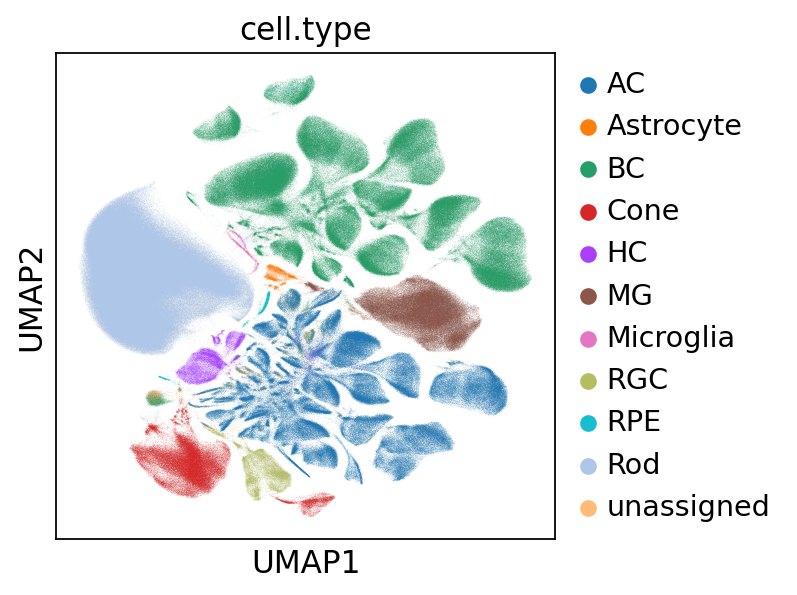

In [159]:
sc.pl.umap(adata, color='cell.type')

In [8]:
ad_embed = anndata.AnnData(obs=embed)
adata.obsm['X_umap'] = ad_embed.obs[['UMAP1', 'UMAP2']].to_numpy()

In [9]:
assert ad_embed.shape[0] == adata.shape[0]

In [10]:
print(embed_path)

/mnt/znas/icb_zstore01/groups/ml01/workspace/ignacio.ibarra/theislab/retinal_scRNAseq_integration/data/integration_march_2021/output/retinal_all_Chen+Hackney_batch_donor_dataset_cell.type/embeddings/unscaled/HVG.1K/scanvi_embed.csv


In [12]:
adata.obsm['X_umap'] = ad_embed.obs[['UMAP1', 'UMAP2']].to_numpy()
query_name = basename(data_dir).split('_')[2]
n_cells = "+".join(map(str, adata.obs['batch_donor_dataset'].str.split('_').str[0].value_counts().values))

In [13]:
adata

AnnData object with n_obs × n_vars = 1907304 × 1000
    obs: 'RNA_snn_res.0.8', 'batch', 'dataset', 'filename', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'scpred_AC', 'scpred_Astrocyte', 'scpred_BC', 'scpred_Cone', 'scpred_HC', 'scpred_MG', 'scpred_Microglia', 'scpred_RGC', 'scpred_RPE', 'scpred_Rod', 'scpred_max', 'scpred_prediction', 'seurat_clusters', 'size_factors', 'cell.type', 'batch.merged', 'donor', 'batch_donor_dataset'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    obsm: 'X_emb', 'X_umap'
    layers: 'counts'

In [95]:
# sc.tl.leiden(adata)

### PAGA using the full object

In [242]:
# n_ac_and_bc = adata[adata.obs['cell.type'].isin({'AC', 'BC'}),:].obs_names.shape[0]
# n_sample = n_ac_and_bc # 100000
# sample_idx = pd.Series(adata[adata.obs['cell.type'].isin({'AC', 'BC'}),:].obs_names).sample(n_sample, random_state=500)
ad = adata.copy()
# ad = adata[adata.obs_names.isin(sample_idx),:]
# ad.shape



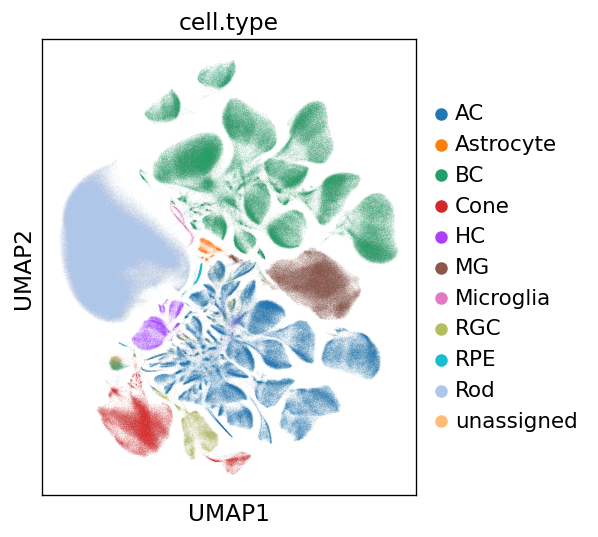

In [243]:
sc.pl.umap(ad, color=['cell.type'])

In [263]:
adata

AnnData object with n_obs × n_vars = 1907304 × 1000
    obs: 'RNA_snn_res.0.8', 'batch', 'dataset', 'filename', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'scpred_AC', 'scpred_Astrocyte', 'scpred_BC', 'scpred_Cone', 'scpred_HC', 'scpred_MG', 'scpred_Microglia', 'scpred_RGC', 'scpred_RPE', 'scpred_Rod', 'scpred_max', 'scpred_prediction', 'seurat_clusters', 'size_factors', 'cell.type', 'batch.merged', 'donor', 'batch_donor_dataset'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'cell.type_colors'
    obsm: 'X_emb', 'X_umap'
    layers: 'counts'

In [245]:
# this takes around 5 min ( full object )
sc.tl.leiden(ad)

KeyError: 'No "neighbors" in .uns'

In [244]:
ad.obs['k.paga'] = ad.obs['cell.type'].astype(str) + ':' + ad.obs['leiden'].astype(str)


KeyError: 'leiden'

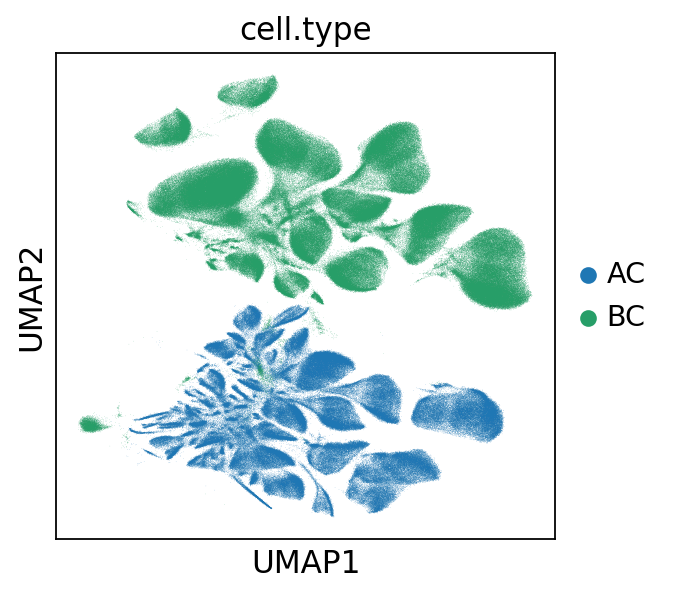

In [205]:
sc.set_figure_params()
sc.pl.umap(ad, color=['cell.type'])

In [177]:
# this is needed due to a current bug - bugfix is coming soon.
ad.uns['neighbors']['distances'] = ad.obsp['distances']
ad.uns['neighbors']['connectivities'] = ad.obsp['connectivities']

# scv.tl.paga(ad, groups='cell.type')
sc.tl.paga(ad, groups='k.paga')

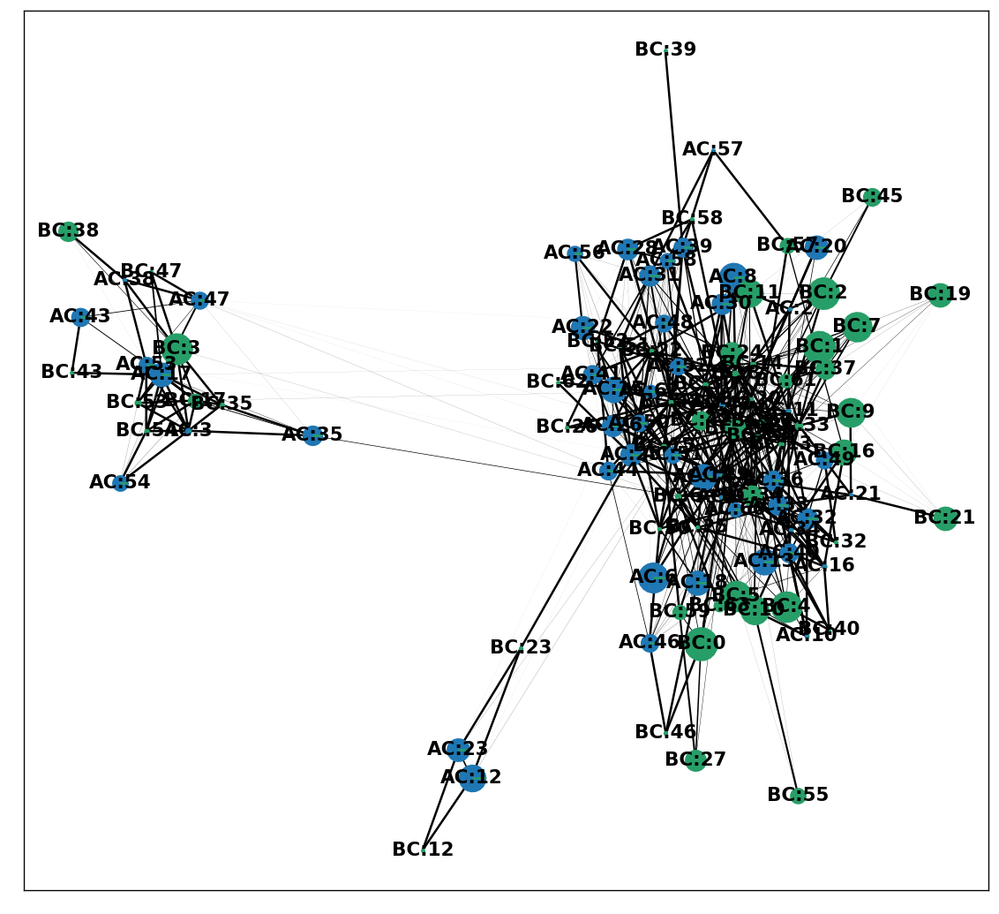

In [207]:
rcParams['figure.figsize'] = 10, 10
rcParams['figure.dpi'] = 60
sc.pl.paga(ad, color='cell.type', edge_width_scale=.2)

In [219]:
# sorted(ad.uns['paga']['connectivities'].A.flatten())[::-1]

In [220]:
# df = scv.get_df(ad, 'paga/connectivities_tree', precision=3).T
df = scv.get_df(ad, 'paga/connectivities', precision=3).T
# df.style.background_gradient(cmap='Blues').format('{:.2g}')

In [221]:
df = df.reset_index().melt('index')
df.columns = columns=['a', 'b', 'value']

In [222]:
df['same'] = df['a'].str.split(':').str[0] == df['b'].str.split(':').str[0]
df['same'].value_counts()
df = df[df['a'].str.split(":").str[0].isin({'AC', "BC"}) & df['b'].str.split(":").str[0].isin({'AC', "BC"})]
# df[df['a'] != df['b']]

In [181]:
import seaborn as sns

In [223]:
df.sort_values('value', ascending=False).head(20)

,a,b,value,same
8002,BC:36,BC:24,1.0,True
9027,AC:49,BC:36,1.0,False
9019,AC:40,BC:36,1.0,False
7720,AC:22,BC:22,1.0,False
3256,AC:57,AC:39,1.0,True
2250,AC:6,AC:29,1.0,True
2253,AC:11,AC:29,1.0,True
7722,AC:25,BC:22,1.0,False
3243,AC:42,AC:39,1.0,True
9016,AC:36,BC:36,1.0,False


In [224]:
df[(df['value'] != 0)].sort_values('value')

,a,b,value,same
5619,BC:5,BC:2,1.574e-05,True
5937,BC:2,BC:5,1.574e-05,True
479,BC:1,AC:8,1.873e-05,False
5461,AC:8,BC:1,1.873e-05,False
5781,AC:6,BC:4,1.973e-05,False
...,...,...,...,...
1626,AC:29,AC:21,1.000e+00,True
8367,AC:29,BC:29,1.000e+00,False
1630,AC:33,AC:21,1.000e+00,True
2681,AC:11,AC:33,1.000e+00,True


In [225]:
# df[~df['same'] & (df['value'] != 0)]

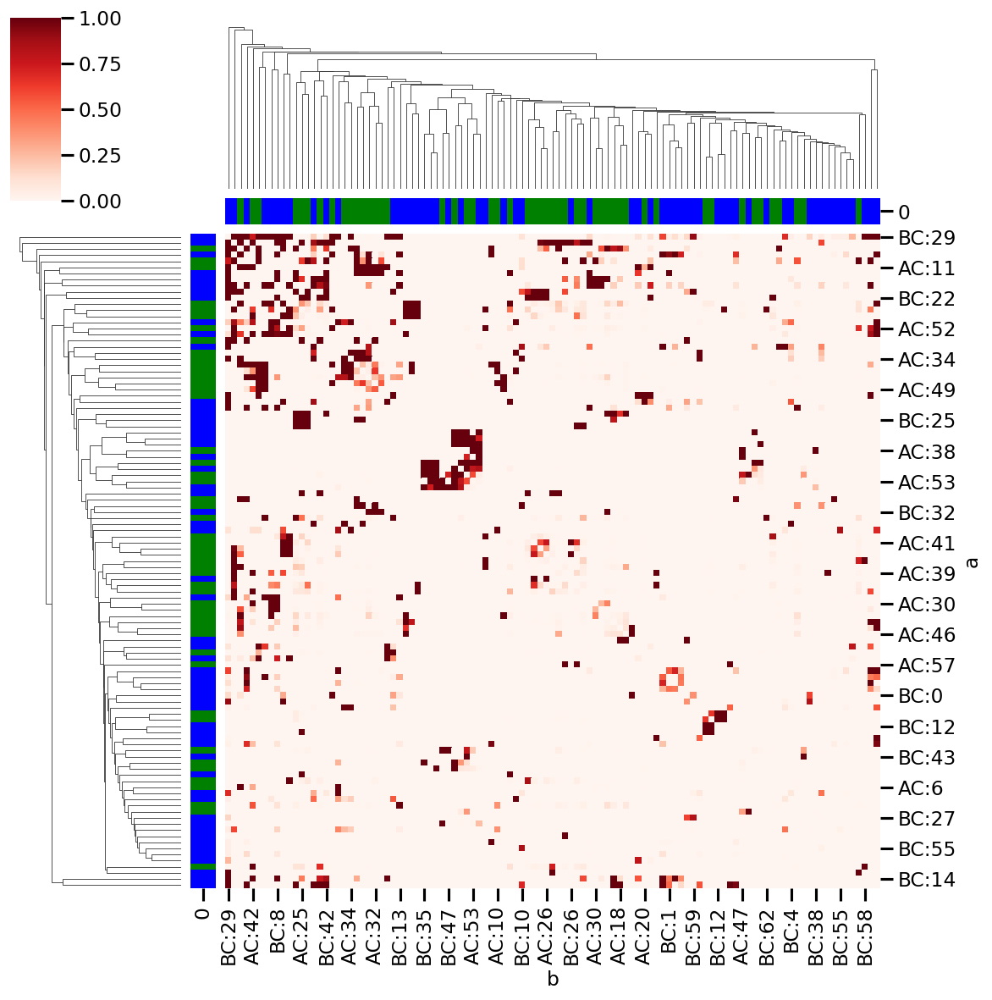

In [226]:
hm = df.pivot('a', 'b', 'value')
assert ((hm.index == hm.columns) == True).any()
row_colors = pd.DataFrame(np.where(hm.index.str.contains('AC'), 'green', 'blue'), index=hm.index)
sns.clustermap(hm, cmap='Reds', row_colors=row_colors, col_colors=row_colors)

In [254]:
df[(df['value'] != 0) & (df['a'] != df['b'])].groupby('same').describe()

value                                                   
        count   mean    std        min    25%    50%    75%  max
same                                                            
False   712.0  0.437  0.469  1.873e-05  0.001  0.113  1.000  1.0
True   1474.0  0.231  0.370  1.574e-05  0.003  0.013  0.304  1.0

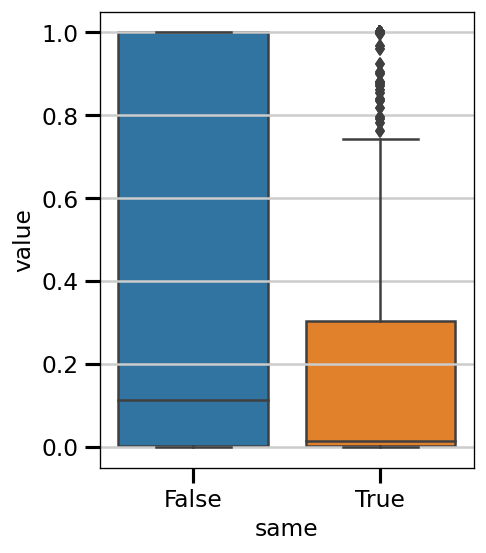

In [255]:
sns.boxplot(data=df[(df['value'] != 0) & (df['a'] != df['b'])], y='value', x='same')
rcParams['figure.figsize'] = [4, 5]

### Repeat the PAGA step only on cells that belong to BC and AC

In [256]:
n_ac_and_bc = adata[adata.obs['cell.type'].isin({'AC', 'BC'}),:].obs_names.shape[0]
n_sample = n_ac_and_bc # 100000
sample_idx = pd.Series(adata[adata.obs['cell.type'].isin({'AC', 'BC'}),:].obs_names).sample(n_sample, random_state=500)
ad = adata[adata.obs_names.isin(sample_idx),:]
ad.shape



(862566, 1000)

In [257]:
%time sc.pp.neighbors(ad)

         Falling back to preprocessing with `sc.pp.pca` and default params.
CPU times: user 13min 42s, sys: 12min 39s, total: 26min 22s
Wall time: 10min 41s


In [258]:
sc.tl.leiden(ad)

In [259]:
ad.obs['k.paga'] = ad.obs['cell.type'].astype(str) + ':' + ad.obs['leiden'].astype(str)


... storing 'k.paga' as categorical


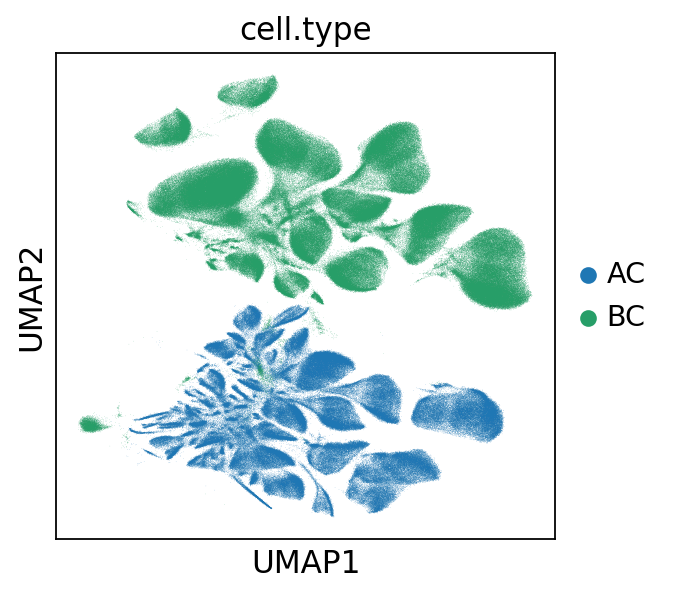

In [260]:
sc.set_figure_params()
sc.pl.umap(ad, color=['cell.type'])

In [261]:
# this is needed due to a current bug - bugfix is coming soon.
ad.uns['neighbors']['distances'] = ad.obsp['distances']
ad.uns['neighbors']['connectivities'] = ad.obsp['connectivities']

# scv.tl.paga(ad, groups='cell.type')
sc.tl.paga(ad, groups='k.paga')

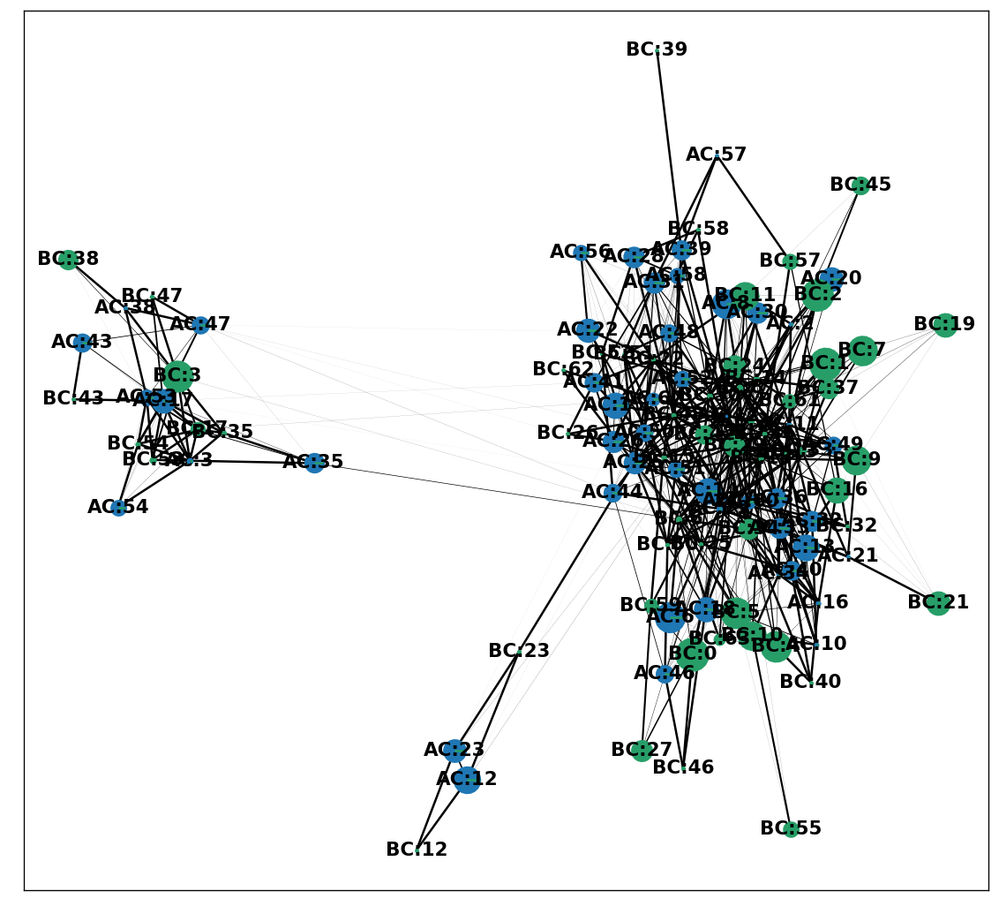

In [262]:
rcParams['figure.figsize'] = 10, 10
rcParams['figure.dpi'] = 60
sc.pl.paga(ad, color='cell.type', edge_width_scale=.2)

In [ ]:
sc.tl.rank_genes_groups()

In [219]:
# sorted(ad.uns['paga']['connectivities'].A.flatten())[::-1]

In [220]:
# df = scv.get_df(ad, 'paga/connectivities_tree', precision=3).T
df = scv.get_df(ad, 'paga/connectivities', precision=3).T
# df.style.background_gradient(cmap='Blues').format('{:.2g}')

In [221]:
df = df.reset_index().melt('index')
df.columns = columns=['a', 'b', 'value']

In [222]:
df['same'] = df['a'].str.split(':').str[0] == df['b'].str.split(':').str[0]
df['same'].value_counts()
df = df[df['a'].str.split(":").str[0].isin({'AC', "BC"}) & df['b'].str.split(":").str[0].isin({'AC', "BC"})]
# df[df['a'] != df['b']]

In [181]:
import seaborn as sns

In [223]:
df.sort_values('value', ascending=False).head(20)

,a,b,value,same
8002,BC:36,BC:24,1.0,True
9027,AC:49,BC:36,1.0,False
9019,AC:40,BC:36,1.0,False
7720,AC:22,BC:22,1.0,False
3256,AC:57,AC:39,1.0,True
2250,AC:6,AC:29,1.0,True
2253,AC:11,AC:29,1.0,True
7722,AC:25,BC:22,1.0,False
3243,AC:42,AC:39,1.0,True
9016,AC:36,BC:36,1.0,False


In [224]:
df[(df['value'] != 0)].sort_values('value')

,a,b,value,same
5619,BC:5,BC:2,1.574e-05,True
5937,BC:2,BC:5,1.574e-05,True
479,BC:1,AC:8,1.873e-05,False
5461,AC:8,BC:1,1.873e-05,False
5781,AC:6,BC:4,1.973e-05,False
...,...,...,...,...
1626,AC:29,AC:21,1.000e+00,True
8367,AC:29,BC:29,1.000e+00,False
1630,AC:33,AC:21,1.000e+00,True
2681,AC:11,AC:33,1.000e+00,True


In [225]:
# df[~df['same'] & (df['value'] != 0)]

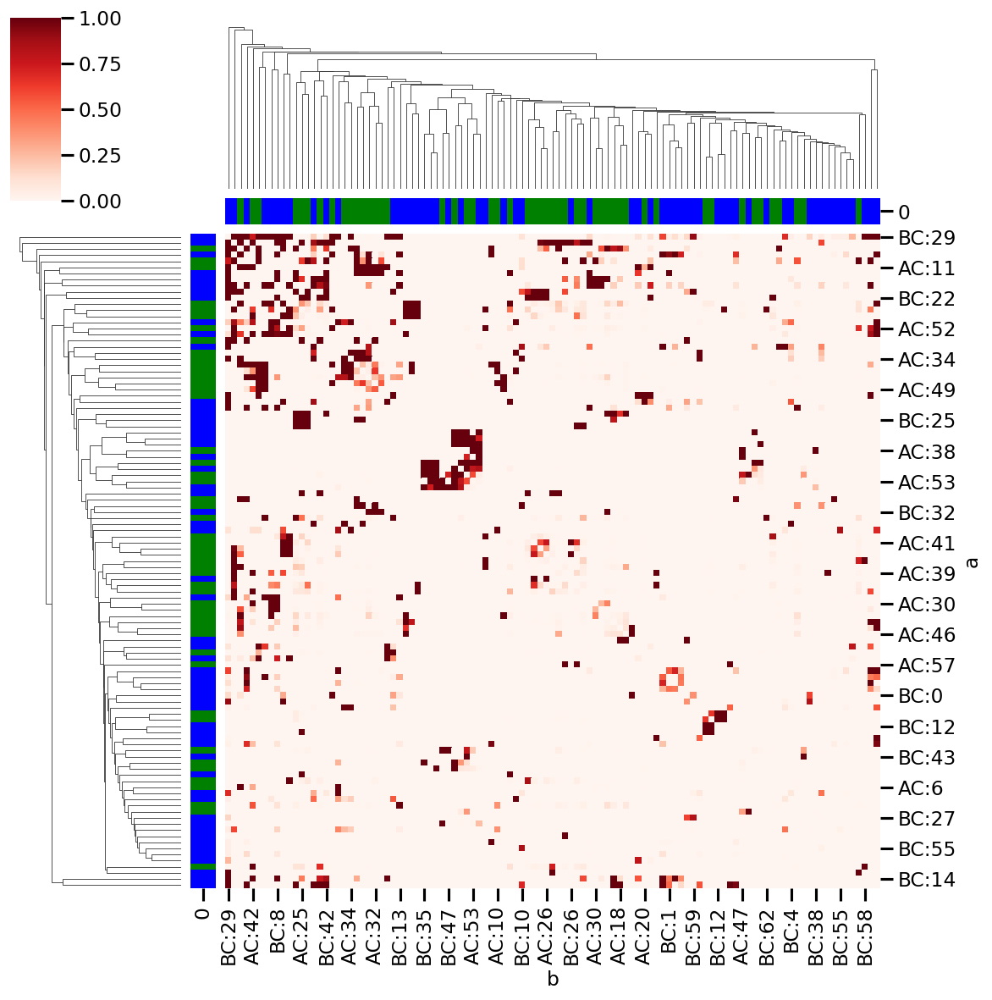

In [226]:
hm = df.pivot('a', 'b', 'value')
assert ((hm.index == hm.columns) == True).any()
row_colors = pd.DataFrame(np.where(hm.index.str.contains('AC'), 'green', 'blue'), index=hm.index)
sns.clustermap(hm, cmap='Reds', row_colors=row_colors, col_colors=row_colors)

In [228]:
df.groupby('same').describe()

value                                             
        count   mean    std  min  25%  50%        75%  max
same                                                      
False  5700.0  0.055  0.220  0.0  0.0  0.0  0.000e+00  1.0
True   5749.0  0.059  0.213  0.0  0.0  0.0  1.490e-04  1.0

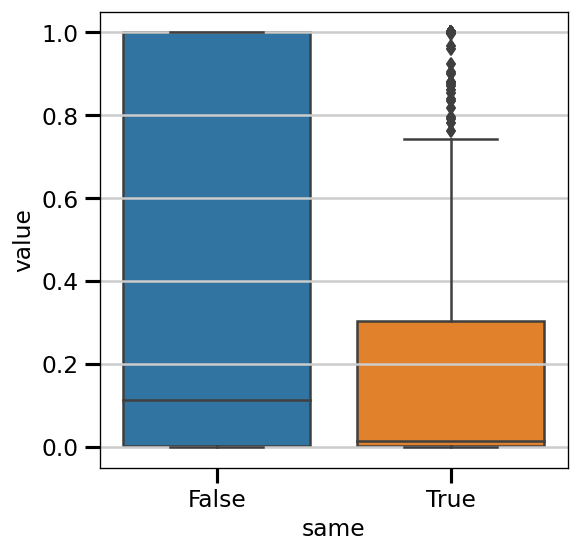

In [234]:
sns.boxplot(data=df[df['value'] != 0], y='value', x='same')
rcParams['figure.figsize'] = [4, 5]

In [42]:
# sc.tl.paga(ad, groups='cell.type')

In [32]:
# ad.uns['paga']['connectivities_tree']#=

<11x11 sparse matrix of type '<class 'numpy.float64'>'
	with 10 stored elements in Compressed Sparse Row format>

In [264]:
ad

AnnData object with n_obs × n_vars = 862566 × 1000
    obs: 'RNA_snn_res.0.8', 'batch', 'dataset', 'filename', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'scpred_AC', 'scpred_Astrocyte', 'scpred_BC', 'scpred_Cone', 'scpred_HC', 'scpred_MG', 'scpred_Microglia', 'scpred_RGC', 'scpred_RPE', 'scpred_Rod', 'scpred_max', 'scpred_prediction', 'seurat_clusters', 'size_factors', 'cell.type', 'batch.merged', 'donor', 'batch_donor_dataset', 'leiden', 'k.paga'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'cell.type_colors', 'neighbors', 'leiden', 'paga', 'k.paga_sizes'
    obsm: 'X_emb', 'X_umap', 'X_pca'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [217]:
sc.tl.leiden(ad)

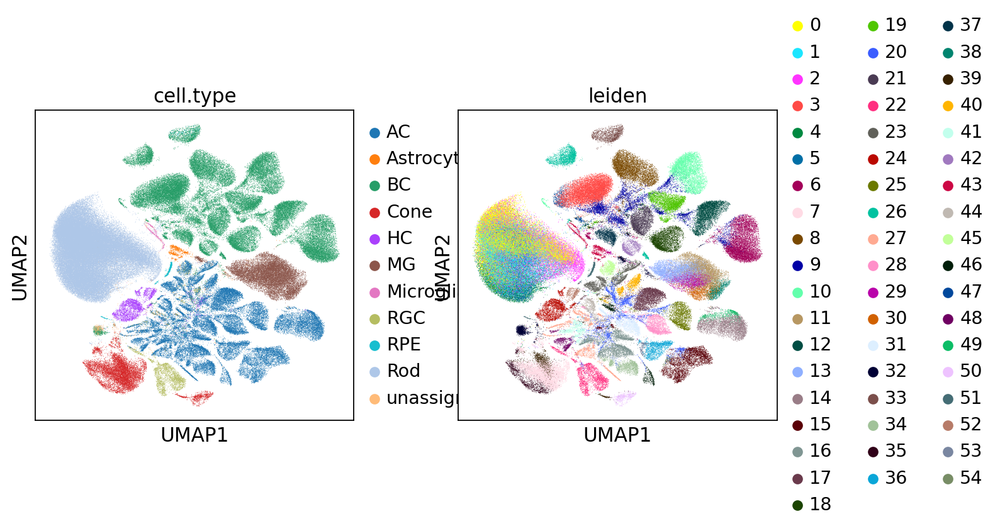

In [218]:
sc.pl.umap(ad, color=['cell.type', 'leiden'])

In [219]:
ad.obs['k.paga'] = ad.obs['cell.type'].astype(str) + ':' + ad.obs['leiden'].astype(str)

# this is needed due to a current bug - bugfix is coming soon.
ad.uns['neighbors']['distances'] = ad.obsp['distances']
ad.uns['neighbors']['connectivities'] = ad.obsp['connectivities']

sc.tl.paga(ad, groups='k.paga')


from matplotlib import rcParams

... storing 'k.paga' as categorical


In [220]:
rcParams['figure.figsize'] = [10, 10]
rcParams['figure.dpi'] = 150

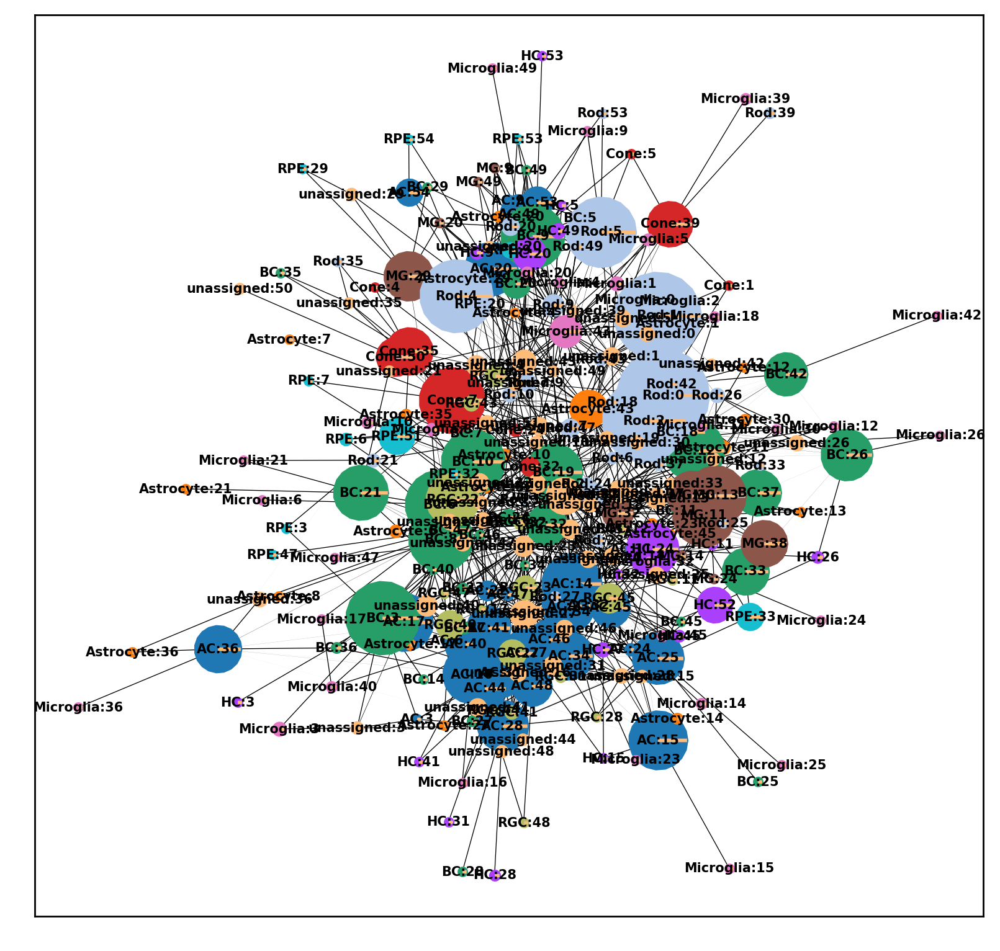

In [224]:
rcParams['figure.figsize'] = [7, 7]
rcParams['figure.dpi'] = 125
sc.pl.paga(ad, color='cell.type', edge_width_scale=.05, fontsize=6, node_size_scale=.3) #  node_size_power=.3)

In [222]:
sc.tl.umap(ad, init_pos="paga")

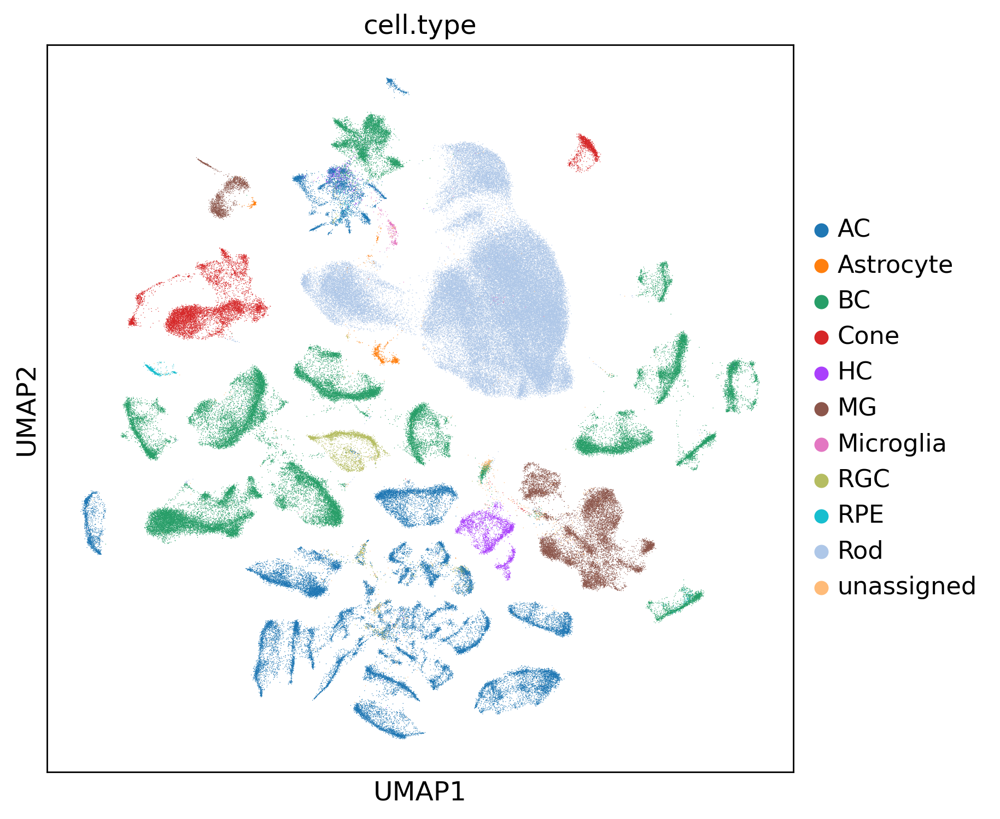

In [223]:
sc.pl.umap(ad, color='cell.type') #  init_pos="paga")

### Attempt to do this with non clustered samples

In [99]:
# print(exists(png_path), embed_path)
# ax = plt.subplot(1, 2, 1)
# embed = pd.read_csv(embed_path, nrows=1000)
data_dir = '/mnt/znas/icb_zstore01/groups/ml01/workspace/ignacio.ibarra/theislab/retinal_scRNAseq_integration'
embed_path = join(data_dir, 'data/integration_march_2021/output/retinal_all_all_batch_donor_dataset_cell.type/integration/unscaled/HVG.1K',
                  'scanvi_None_20_Hafler_Roska_Sanes_Scheetz_Wong_NROSKA_125000_NEPOCHS_20_NLAYERS_3_NHIDDEN_256_embed.csv')
adata_path = join(data_dir, 'data/integration_march_2021/output/retinal_all_all_batch_donor_dataset_cell.type/integration/unscaled/HVG.1K',
                  'scanvi_None_20_Hafler_Roska_Sanes_Scheetz_Wong_NROSKA_125000_NEPOCHS_20_NLAYERS_3_NHIDDEN_256.h5ad')

print(exists(embed_path), embed_path)

embed = pd.read_csv(embed_path)

print(embed.shape)
# ad = anndata.AnnData(obs=embed)
sc.set_figure_params(facecolor='white')
print(embed.shape)

True /mnt/znas/icb_zstore01/groups/ml01/workspace/ignacio.ibarra/theislab/retinal_scRNAseq_integration/data/integration_march_2021/output/retinal_all_all_batch_donor_dataset_cell.type/integration/unscaled/HVG.1K/scanvi_None_20_Hafler_Roska_Sanes_Scheetz_Wong_NROSKA_125000_NEPOCHS_20_NLAYERS_3_NHIDDEN_256_embed.csv
(2004220, 5)
(2004220, 5)


In [100]:
adata = sc.read_h5ad(adata_path)

In [101]:
ad_embed = anndata.AnnData(obs=embed)
adata.obsm['X_umap'] = ad_embed.obs[['UMAP1', 'UMAP2']].to_numpy()

In [102]:
assert ad_embed.shape[0] == adata.shape[0]

In [103]:
print(embed_path)

/mnt/znas/icb_zstore01/groups/ml01/workspace/ignacio.ibarra/theislab/retinal_scRNAseq_integration/data/integration_march_2021/output/retinal_all_all_batch_donor_dataset_cell.type/integration/unscaled/HVG.1K/scanvi_None_20_Hafler_Roska_Sanes_Scheetz_Wong_NROSKA_125000_NEPOCHS_20_NLAYERS_3_NHIDDEN_256_embed.csv


In [104]:
adata.obsm['X_umap'] = adata.obs[['UMAP1', 'UMAP2']].to_numpy()
query_name = basename(d).split('_')[2]
n_cells = "+".join(map(str, adata.obs['batch_donor_dataset'].str.split('_').str[0].value_counts().values))

In [105]:
adata

AnnData object with n_obs × n_vars = 2004220 × 1000
    obs: 'RNA_snn_res.0.8', 'batch', 'dataset', 'filename', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'scpred_AC', 'scpred_Astrocyte', 'scpred_BC', 'scpred_Cone', 'scpred_HC', 'scpred_MG', 'scpred_Microglia', 'scpred_RGC', 'scpred_RPE', 'scpred_Rod', 'scpred_max', 'scpred_prediction', 'seurat_clusters', 'size_factors', 'cell.type', 'batch.merged', 'donor', 'batch_donor_dataset', 'UMAP1', 'UMAP2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'neighbors', 'umap'
    obsm: 'X_emb', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [168]:
n_sample = 50000
sample_idx = pd.Series(adata.obs_names).sample(n_sample, random_state=500)
ad = adata[adata.obs_names.isin(sample_idx),:]
ad.shape

(50000, 1000)

In [169]:
sc.pp.neighbors(ad)

         Falling back to preprocessing with `sc.pp.pca` and default params.


In [170]:
sc.tl.leiden(ad)

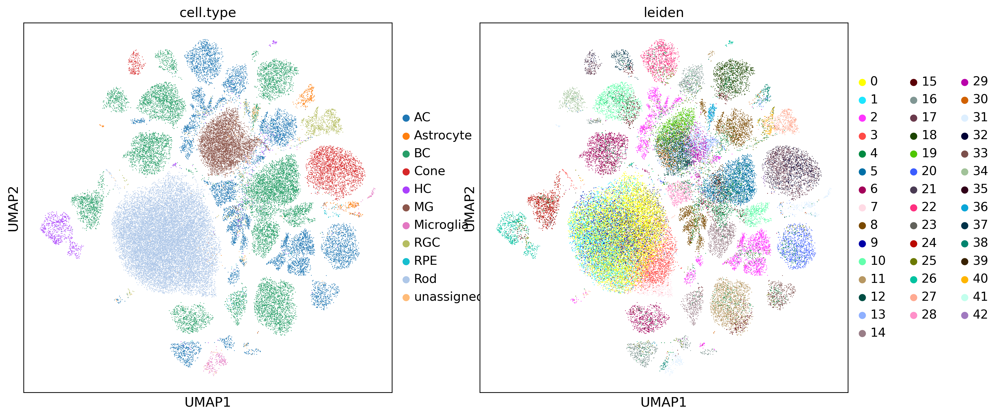

In [171]:
sc.pl.umap(ad, color=['cell.type', 'leiden'])

In [243]:
ad.obs['k.paga'] = ad.obs['cell.type'].astype(str) + ':' + ad.obs['leiden'].astype(str)

# this is needed due to a current bug - bugfix is coming soon.
ad.uns['neighbors']['distances'] = ad.obsp['distances']
ad.uns['neighbors']['connectivities'] = ad.obsp['connectivities']

sc.tl.paga(ad, groups='k.paga')

from matplotlib import rcParams

... storing 'k.paga' as categorical


In [244]:
print('here...')

here...


In [249]:
ad.uns['k.paga_sizes']

array([    1,     4,     4,     4,  4045,  3718,  3552,  3422,  2492,
          35,  2339,     4,  2167,  1784,  2044,  1771,     6,  1584,
        1470,   915,  1102,   946,   711,   801,     3,   725,   694,
         264,   141,     1,     1,     4,     1,     1,     4,     6,
           1,     1,     2,     2,     2,     1,     2,     1,    97,
           3,     2,     2,     1,   577,     1,  9247,     6,  7134,
           2,  5409,  5176,  5162,     1,  4383,     1,     3,  3325,
        3298,   183,  2773,     2,    15,     1,  2147,     2,     1,
           1,   797,  1451,     1,     1,     2,  1387,     1,  1033,
           1,     1,   771,     1,     1,     1,     1,  5861,     4,
          31,  1506,  1259,   639,     1,     1,     5,     2,     1,
         345,  2321,     3,     8,     2,     1,     1,     1,     3,
           9,   455,     1,     1,  4976,  4104,     2,     1,     1,
        1788,  1840,   258,  1384,     1,     2,     7,     1,     7,
           1,     3,

In [241]:
df = scv.get_df(asel, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

AnnData object with n_obs × n_vars = 200000 × 1000
    obs: 'RNA_snn_res.0.8', 'batch', 'dataset', 'filename', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'scpred_AC', 'scpred_Astrocyte', 'scpred_BC', 'scpred_Cone', 'scpred_HC', 'scpred_MG', 'scpred_Microglia', 'scpred_RGC', 'scpred_RPE', 'scpred_Rod', 'scpred_max', 'scpred_prediction', 'seurat_clusters', 'size_factors', 'cell.type', 'batch.merged', 'donor', 'batch_donor_dataset', 'leiden', 'k.paga'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'neighbors', 'leiden', 'cell.type_colors', 'leiden_colors', 'paga', 'k.paga_sizes', 'umap'
    obsm: 'X_emb', 'X_umap', 'X_pca'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [173]:
rcParams['figure.figsize'] = [20, 20]
rcParams['figure.dpi'] = 150

In [178]:
# sc.pl.paga_compare(ad, color='cell.type', basis='umap')
#                    # fontsize=6, node_size_scale=.3, node_size_power=.3)

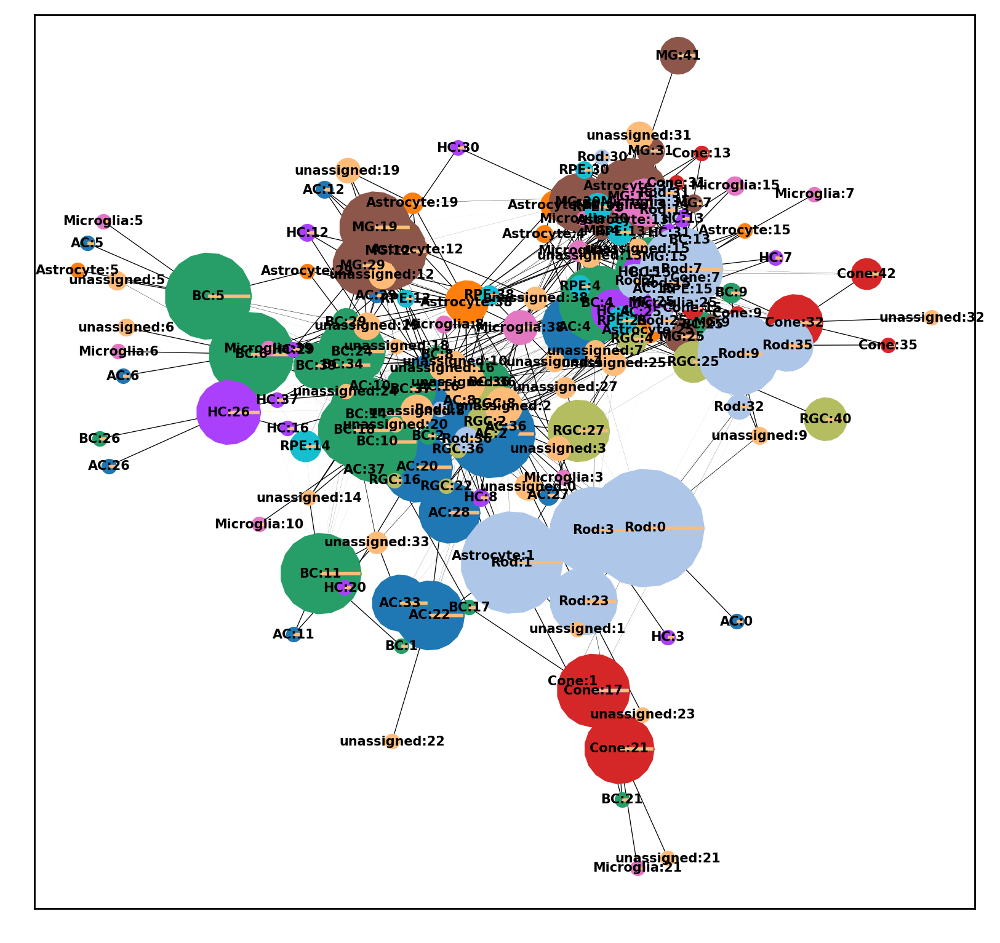

In [175]:
rcParams['figure.figsize'] = [7, 7]
rcParams['figure.dpi'] = 125
sc.pl.paga(ad, color='cell.type', edge_width_scale=.05, fontsize=6) #  node_size_scale=.3) #  node_size_power=.3)

In [176]:
sc.tl.umap(ad, init_pos="paga")

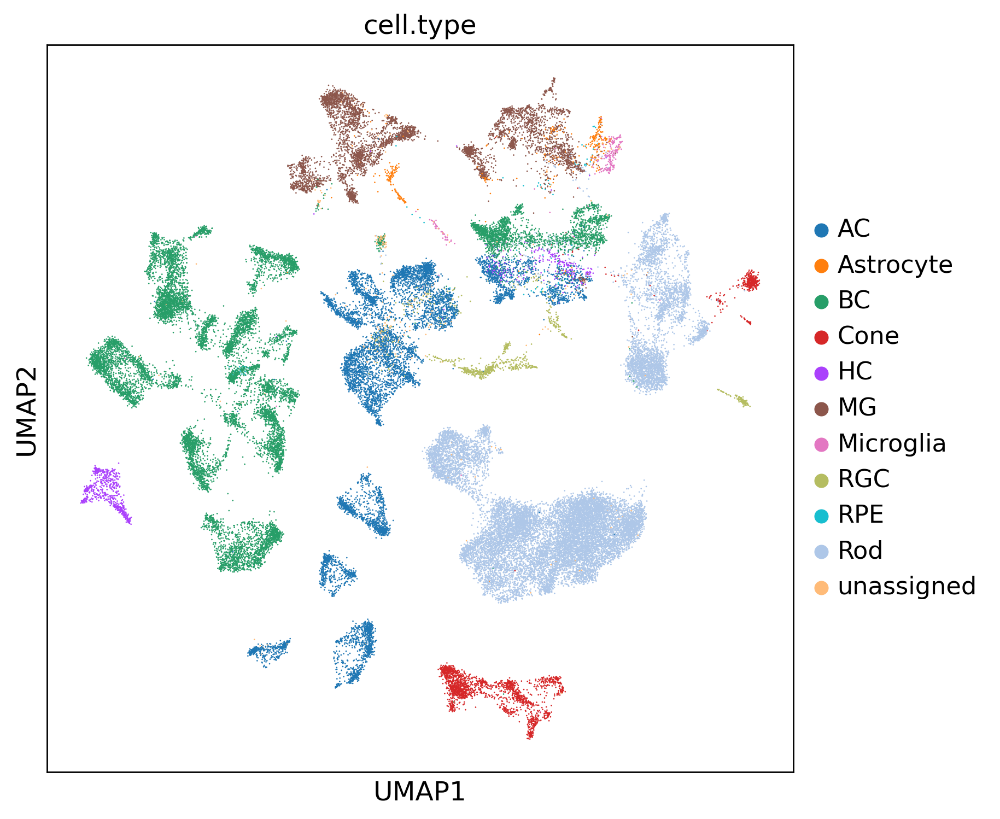

In [177]:
sc.pl.umap(ad, color='cell.type') #  init_pos="paga")

## Subsample-based computation of metrics and their timings

In [180]:
import scIB

In [ ]:
scIB.metrics.metrics()

In [188]:
n_sample = 1000
sample_idx = pd.Series(adata.obs_names).sample(n_sample, random_state=500)
ad_integrated = adata[adata.obs_names.isin(sample_idx),:]
ad_integrated.shape

(1000, 1000)

In [184]:
adata_unintegrated_path = join('/mnt/znas/icb_zstore01/groups/ml01/workspace/ignacio.ibarra/theislab/retinal_scRNAseq_integration/data',
                               'integration_march_2021/output/retinal_all_all_batch_donor_dataset_cell.type/prepare/unscaled/HVG.1K/adata_pre.h5ad')
adata_unintegrated = sc.read_h5ad(adata_unintegrated_path)

In [185]:
adata_unintegrated.shape

(2159366, 1000)

In [189]:
ad_unintegrated = adata_unintegrated[adata_unintegrated.obs_names.isin(sample_idx),:]


In [191]:
sum(ad_integrated.obs_names == ad_unintegrated.obs_names) == ad_unintegrated.shape[0]

True

In [194]:
scIB.metrics.metrics?

Signature:
scIB.metrics.metrics(
    adata,
    adata_int,
    batch_key,
    label_key,
    hvg_score_=True,
    cluster_nmi=None,
    nmi_=False,
    ari_=False,
    nmi_method='arithmetic',
    nmi_dir=None,
    silhouette_=False,
    embed='X_pca',
    si_metric='euclidean',
    pcr_=False,
    cell_cycle_=False,
    organism='mouse',
    verbose=False,
    isolated_labels_=False,
    n_isolated=None,
    graph_conn_=False,
    kBET_=False,
    kBET_sub=0.5,
    lisi_graph_=False,
    lisi_raw=False,
    trajectory_=False,
    type_=None,
)
Docstring: summary of all metrics for one Anndata object
File:      ~/miniconda3/envs/scIB-python/lib/python3.7/site-packages/scIB/metrics.py
Type:      function


In [202]:
ad_unintegrated.obs

,RNA_snn_res.0.8,batch,dataset,filename,nCount_RNA,nFeature_RNA,orig.ident,scpred_AC,scpred_Astrocyte,scpred_BC,...,scpred_RPE,scpred_Rod,scpred_max,scpred_prediction,seurat_clusters,size_factors,cell.type,batch.merged,donor,batch_donor_dataset
TAAGAGACAGTAAGCG-1_1-0:Roska:0,10,0,Roska,R-00646_03_Fovea_Retina_Left,538.0,344,SeuratProject,1.994040e-06,0.000006,0.000096,...,0.000060,0.000233,0.999893,MG,10,0.175168,MG,92,Roska_R-00646_03,Roska_R-00646_03:Roska:0
TATTACCCAATACGCT-1_2-0:Roska:0,5,0,Roska,R-00646_03_Fovea_Retina_Left,9930.0,3703,SeuratProject,6.476156e-09,0.000015,0.000030,...,0.000051,0.000195,1.000000,RGC,5,3.676311,RGC,92,Roska_R-00646_03,Roska_R-00646_03:Roska:0
TGTGTTTAGGCCCGTT-1_3-1:Roska:1,12,1,Roska,R-00646_04_Fovea_Retina_Right,1969.0,1067,SeuratProject,1.498353e-05,0.000144,0.999998,...,0.000108,0.000030,0.999998,BC,12,0.464653,BC,93,Roska_R-00646_04,Roska_R-00646_04:Roska:1
TCCTCCCAGAGTATAC-1_1-4:Roska:4,13,4,Roska,R-00646_07_Periphery_ChoroidRPE,615.0,414,SeuratProject,1.238235e-06,0.000008,0.000100,...,0.000113,0.999048,0.999048,Rod,13,0.119597,Rod,109,Roska_R-00646_07,Roska_R-00646_07:Roska:4
GTACGTATCACCGGGT-1_1-6:Roska:6,0,6,Roska,R-00646_04_Periphery_Retina_Left,3273.0,1441,SeuratProject,2.943708e-07,0.000020,0.000083,...,0.000046,0.999945,0.999945,Rod,0,1.220728,Rod,111,Roska_R-00646_04,Roska_R-00646_04:Roska:6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGTGAGTGTCTCCCTA-1_2-38:Chen_a:38,0,38,Chen_a,10x3_Lobe_19_D003_Nu,2008.0,1291,0,1.909167e-07,0.000037,0.000084,...,0.000051,0.999961,0.999961,Rod,0,0.758764,Rod,32,Chen_19_D003,Chen_19_D003:Chen_a:38
TTTGGAGTCATTTGCT-1_2-38:Chen_a:38,25,38,Chen_a,10x3_Lobe_19_D003_Nu,3701.0,2001,0,7.581376e-04,0.000644,0.999901,...,0.000146,0.000021,0.999901,BC,25,1.341887,BC,32,Chen_19_D003,Chen_19_D003:Chen_a:38
CGGTCAGTCAAGGCTT-1-39:Chen_a:39,27,39,Chen_a,10x_Lobe_D017_18_13_Nu,5081.0,2217,0,9.990806e-01,0.000624,0.000421,...,0.000148,0.000025,0.999081,AC,27,0.935055,AC,33,Chen_D017_13,Chen_D017_13:Chen_a:39
TCAGGGCAGACCAAAT-1-39:Chen_a:39,0,39,Chen_a,10x_Lobe_D017_18_13_Nu,5678.0,2354,0,4.900497e-07,0.000037,0.000085,...,0.000056,0.999565,0.999565,Rod,0,0.944223,Rod,33,Chen_D017_13,Chen_D017_13:Chen_a:39


In [204]:
sc.tl.pca(ad_unintegrated)
sc.tl.pca(ad_integrated)

In [237]:
scIB.metrics.metrics(
    adata=ad_unintegrated,
    adata_int=ad_integrated,
    batch_key='batch_donor_dataset',
    label_key='cell.type',
    hvg_score_=False,
    # cluster_key='cluster',
    # cluster_nmi='abc/test.csv',
    ari_=True,
    nmi_=True,
    nmi_method='arithmetic',
    nmi_dir='abc/test.csv',
    silhouette_=True,
    embed='X_pca',
    si_metric='euclidean',
    pcr_=True,
    # cell_cycle_=False,
    # cell_cycle_complex_=False,
#     organism='mouse',
    isolated_labels_=True,  # backwards compatibility
    # isolated_labels_f1_=False,
    # isolated_labels_asw_=False,
    n_isolated=None,
    graph_conn_=False,
    # kBET_=False,
    # subsample=0.5,
#     lisi_graph_=False,
#     ilisi_=False,
#     clisi_=False,
    trajectory_=False,
    type_=None,
    verbose=False,
)

clustering...
NMI...
ARI...
silhouette score...
PC regression...
isolated labels...


,0
NMI_cluster/label,0.381854
ARI_cluster/label,0.000062
ASW_label,0.549399
ASW_label/batch,0.878980
PCR_batch,0.000000
cell_cycle_conservation,NaN
isolated_label_F1,0.333333
isolated_label_silhouette,0.545427
graph_conn,NaN
kBET,NaN
